# YOLOv8 — Car Detection

This notebook trains an **Ultralytics YOLOv8** model on the same car dataset. The steps are:

1. Convert the bounding-box CSV to YOLO-format label files.
2. Split images into train/val folders and write a `dataset.yaml`.
3. Explore the dataset (box sizes, aspect ratios, heat-map of car locations).
4. Train YOLOv8n and inspect the training curves and metrics.
5. Run inference on the held-out test set and visualise predictions.

## 1. Install Ultralytics

In [1]:
pip install ultralytics --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/1.1 MB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 1.1/1.1 MB 40.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.4 MB/s eta 0:00:00


## 2. Imports

In [2]:
import pandas as pd
import numpy as np
import os
import cv2
import shutil
from pathlib import Path
import random
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## 3. Inspect the local dataset folder

In [4]:
!ls data


 sample_submission.csv	 training_images
 testing_images		'train_solution_bounding_boxes (1).csv'


## 4. Load bounding-box annotations

In [5]:
df = pd.read_csv("data/train_solution_bounding_boxes.csv")
print(df.head())


             image        xmin        ymin        xmax        ymax
0   vid_4_1000.jpg  281.259045  187.035071  327.727931  223.225547
1  vid_4_10000.jpg   15.163531  187.035071  120.329957  236.430180
2  vid_4_10040.jpg  239.192475  176.764801  361.968162  236.430180
3  vid_4_10020.jpg  496.483358  172.363256  630.020260  231.539575
4  vid_4_10060.jpg   16.630970  186.546010  132.558611  238.386422


## 5. Distribution of box width and height

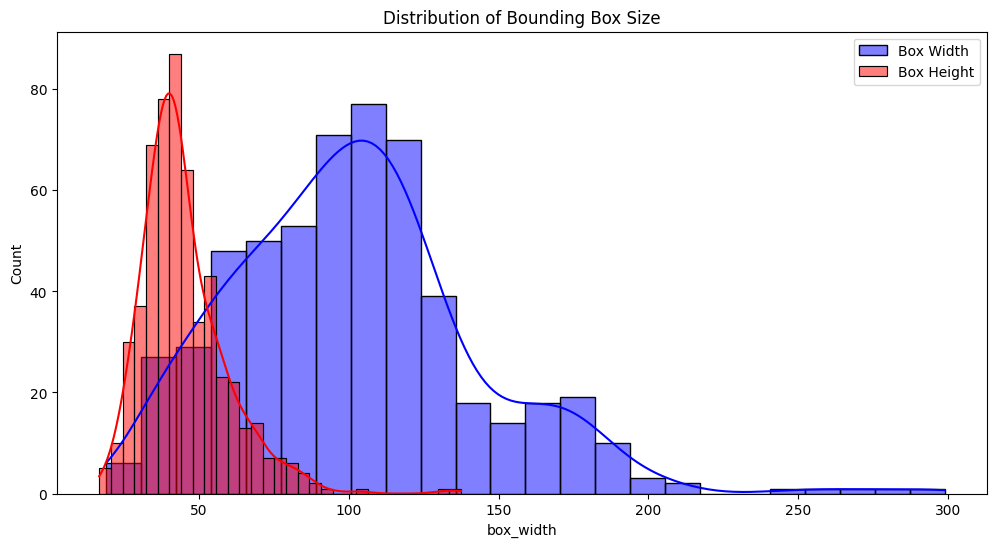

In [6]:
df['box_width'] = df['xmax'] - df['xmin']
df['box_height'] = df['ymax'] - df['ymin']

plt.figure(figsize=(12,6))
sns.histplot(df['box_width'], kde=True, color='blue', label='Box Width')
sns.histplot(df['box_height'], kde=True, color='red', label='Box Height')
plt.title("Distribution of Bounding Box Size")
plt.legend()
plt.show()


## 6. Aspect-ratio distribution

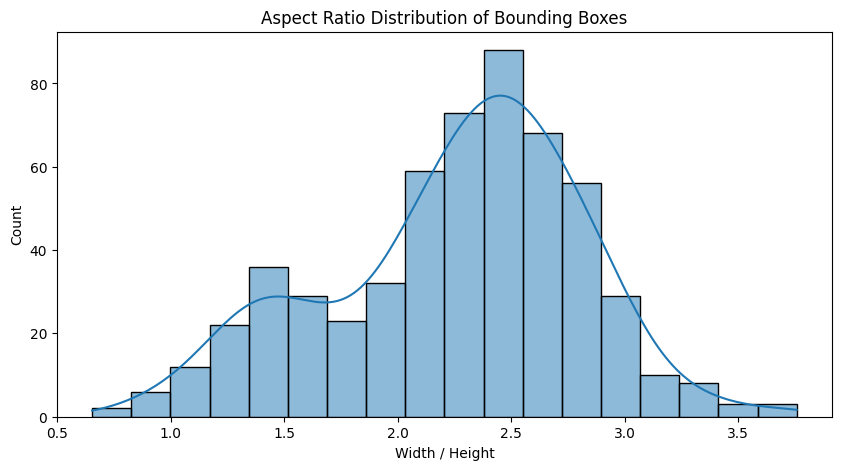

In [7]:
df['aspect_ratio'] = df['box_width'] / df['box_height']

plt.figure(figsize=(10,5))
sns.histplot(df['aspect_ratio'], kde=True)
plt.title("Aspect Ratio Distribution of Bounding Boxes")
plt.xlabel("Width / Height")
plt.show()


## 7. Create the YOLO labels folder

In [8]:
labels_dir = "labels/"

os.makedirs(labels_dir, exist_ok=True)

print("Labels folder created at:", labels_dir)

Labels folder created at: /content/drive/MyDrive/labels/


## 8. Convert annotations to YOLO format

For each image, write a `.txt` label file with one line per bounding box, normalised to `[x_center, y_center, width, height]` in `[0, 1]`.

In [9]:
for img_name, group in df.groupby("image"):
    img_path = f"data/training_images/{img_name}"
    img = cv2.imread(img_path)
    h, w, _ = img.shape


    label_path = os.path.join(labels_dir, img_name.replace(".jpg", ".txt"))
    with open(label_path, "w") as f:
        for _, row in group.iterrows():
            xmin, ymin, xmax, ymax = row[["xmin", "ymin", "xmax", "ymax"]]


            x_center = ((xmin + xmax) / 2) / w
            y_center = ((ymin + ymax) / 2) / h
            width = (xmax - xmin) / w
            height = (ymax - ymin) / h

            f.write(f"0 {x_center} {y_center} {width} {height}\n")

## 9. Visualise a random labelled sample

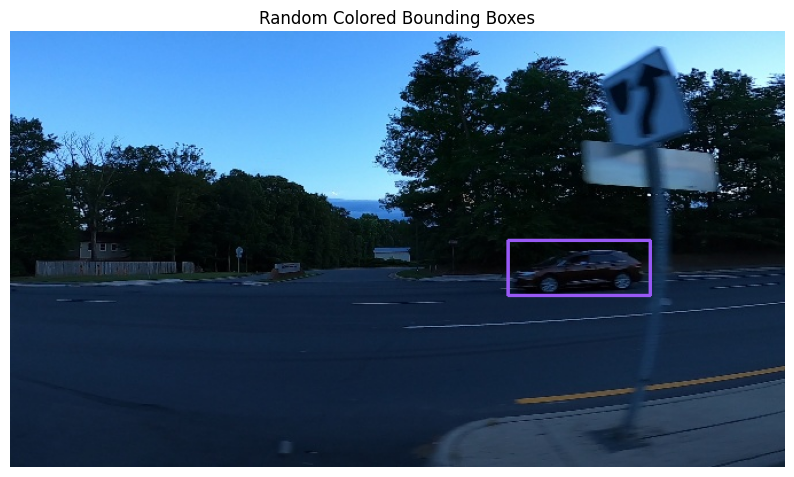

In [10]:
# Pick random image from dataset
sample_img = random.choice(df['image'].unique())

# Build image path correctly
img_path = f"data/training_images/{sample_img}"

# Load and convert image to RGB
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Draw bounding boxes
for _, row in df[df['image'] == sample_img].iterrows():
    xmin, ymin, xmax, ymax = row[['xmin', 'ymin', 'xmax', 'ymax']]

    # Convert to int so OpenCV accepts them
    xmin, ymin, xmax, ymax = map(int, [xmin, ymin, xmax, ymax])

    # Random bounding box color
    color = [random.randint(50,255), random.randint(50,255), random.randint(50,255)]

    # Draw box
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), color, 2)

# Show with matplotlib
plt.figure(figsize=(10,7))
plt.imshow(img)
plt.title("Random Colored Bounding Boxes")
plt.axis("off")
plt.show()


## 10. Train / validation split

Copy images and their labels into `dataset/images/{train,val}` and `dataset/labels/{train,val}`.

In [11]:
images_dir = Path("data/training_images")
labels_dir = Path("labels")
output_dir = Path("dataset")

all_images = list(images_dir.glob("*.jpg"))

train_imgs, val_imgs = train_test_split(all_images, test_size=0.2, random_state=42)

for split in ["train", "val"]:
    (output_dir / f"images/{split}").mkdir(parents=True, exist_ok=True)
    (output_dir / f"labels/{split}").mkdir(parents=True, exist_ok=True)

def move_files(img_list, split):
    for img_path in img_list:
        dest_img = output_dir / f"images/{split}/{img_path.name}"
        shutil.copy2(img_path, dest_img)

        label_file = labels_dir / (img_path.stem + ".txt")
        if label_file.exists():
            dest_label = output_dir / f"labels/{split}/{label_file.name}"
            shutil.copy2(label_file, dest_label)

move_files(train_imgs, "train")
move_files(val_imgs, "val")


## 11. Write `dataset.yaml`

Ultralytics consumes a YAML file describing the dataset paths and class names.

In [13]:
yaml_path = "dataset.yaml"

yaml_content = """
train: dataset/images/train
val: dataset/images/val
nc: 1
names: ['car']
"""

with open(yaml_path, "w") as f:
    f.write(yaml_content)

print(f"dataset.yaml created at: {yaml_path}")


dataset.yaml created at: /content/drive/MyDrive/dataset.yaml


## 12. Visualise training samples with their YOLO labels

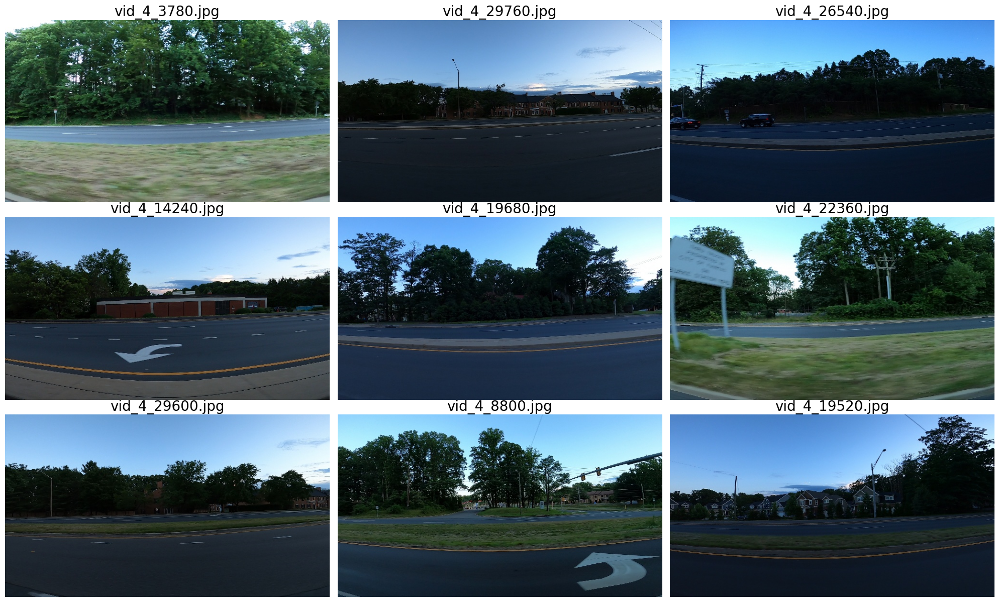

In [15]:
class_img = { 0: "car" }

train_images_dir = Path("dataset/images/train")
image_files = list(train_images_dir.glob("*.jpg"))
sample_files = random.sample(image_files, min(9, len(image_files)))

fig, axes = plt.subplots(3, 3, figsize=(20, 12))
axes = axes.flatten()

for ax, img_path in zip(axes, sample_files):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(img_path.name, fontsize=20)

plt.tight_layout()
plt.show()


## 13. Heat-map of car locations

Aggregate the centre points of every annotated box to see where cars typically appear in the frame.

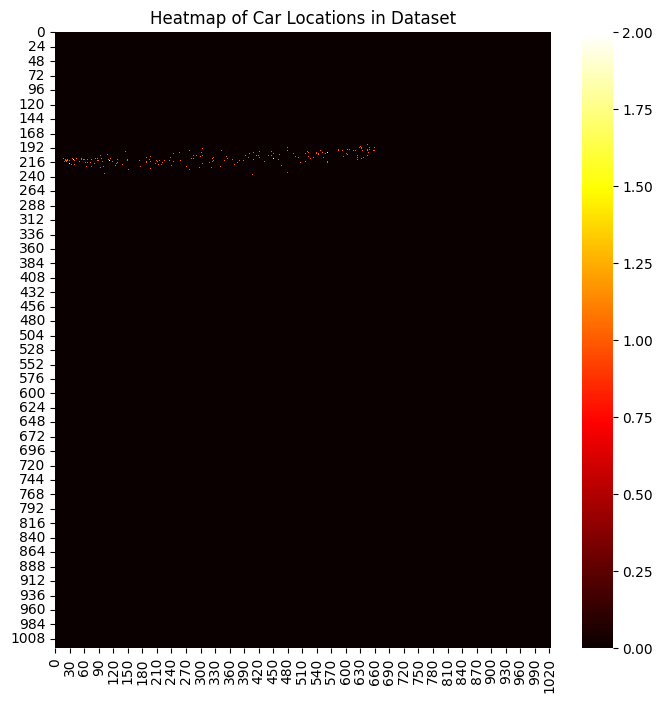

In [17]:
heatmap = np.zeros((1024, 1024))

for _, row in df.iterrows():
    xc = int((row['xmin'] + row['xmax'])/2)
    yc = int((row['ymin'] + row['ymax'])/2)
    if xc < 1024 and yc < 1024:
        heatmap[yc, xc] += 1

plt.figure(figsize=(8,8))
sns.heatmap(heatmap, cmap='hot')
plt.title("Heatmap of Car Locations in Dataset")
plt.show()


## 14. Dataset split sizes

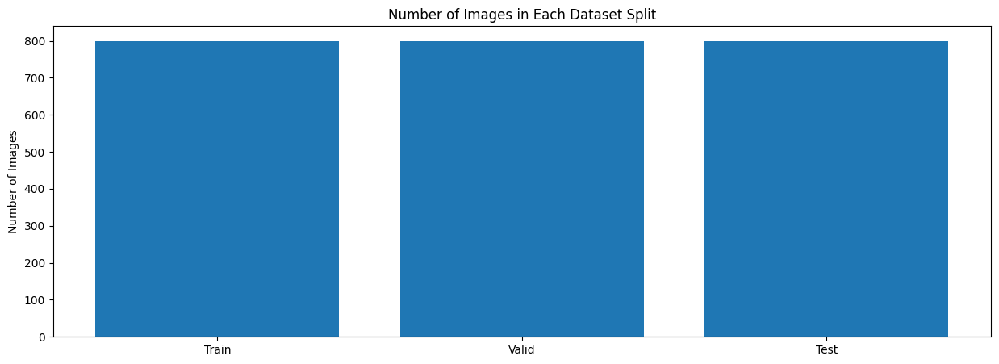

In [19]:
train_dir = Path("dataset/images/train")
valid_dir = Path("dataset/images/val")
test_dir = Path("data/testing_images")

train_count = len(list(train_images_dir.glob("*.jpg")))
valid_count = len(list(train_images_dir.glob("*.jpg")))
test_count = len(list(train_images_dir.glob("*.jpg")))

plt.figure(figsize=(15,5))
plt.bar(['Train', 'Valid', 'Test'], [train_count, valid_count, test_count])
plt.title('Number of Images in Each Dataset Split')
plt.ylabel('Number of Images')
plt.show()


## 15. Train YOLOv8n

Fine-tune the nano variant of YOLOv8 on the car dataset.

In [21]:
model = YOLO("yolov8n.pt")
model.info()

results = model.train(data=yaml_path, epochs=50, batch=-1, imgsz=640, workers=5)


YOLOv8n summary: 129 layers, 3,157,200 parameters, 0 gradients
Ultralytics 8.3.229 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=-1, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto

## 16. Display Ultralytics' training plots

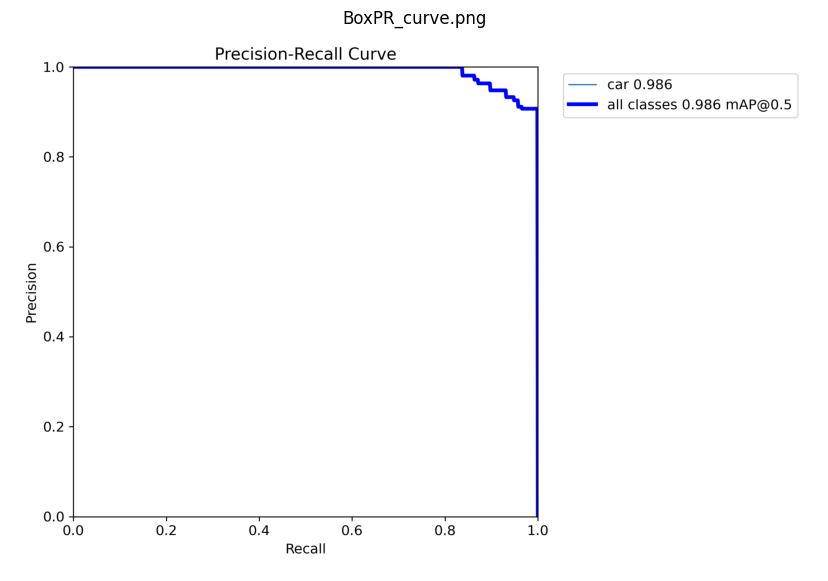

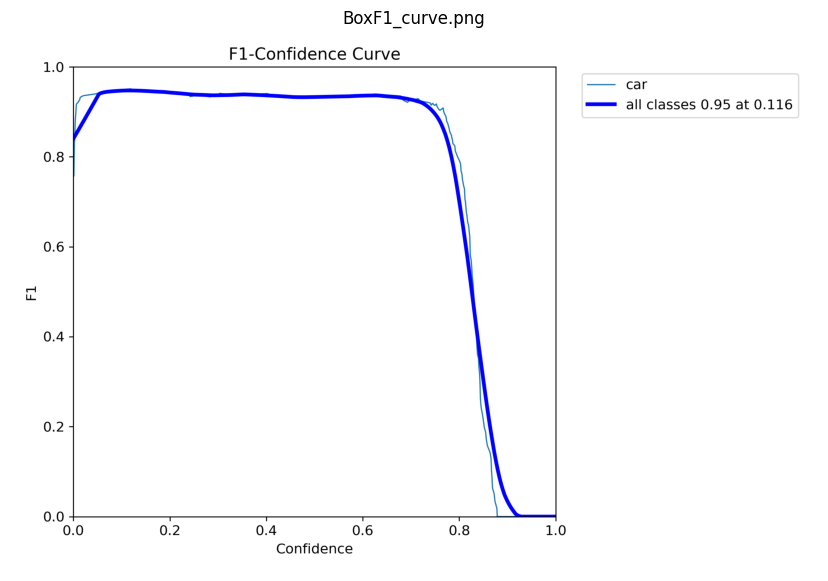

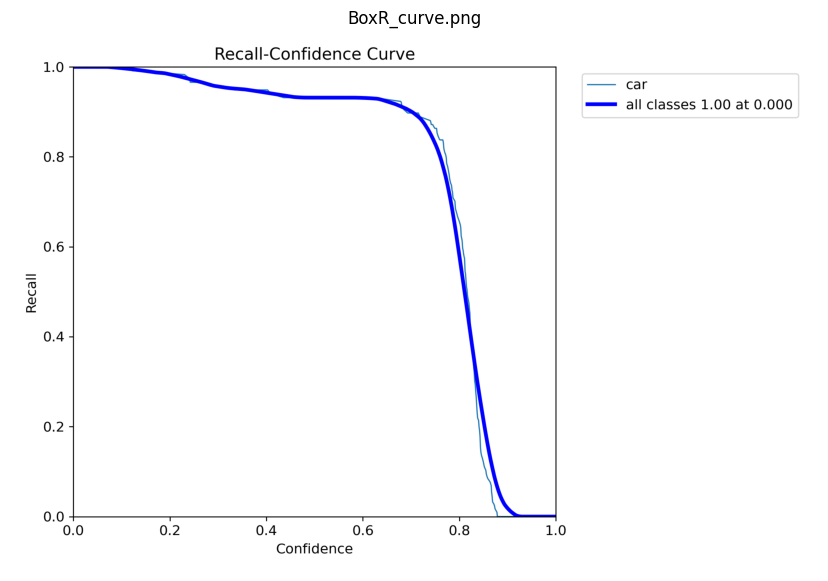

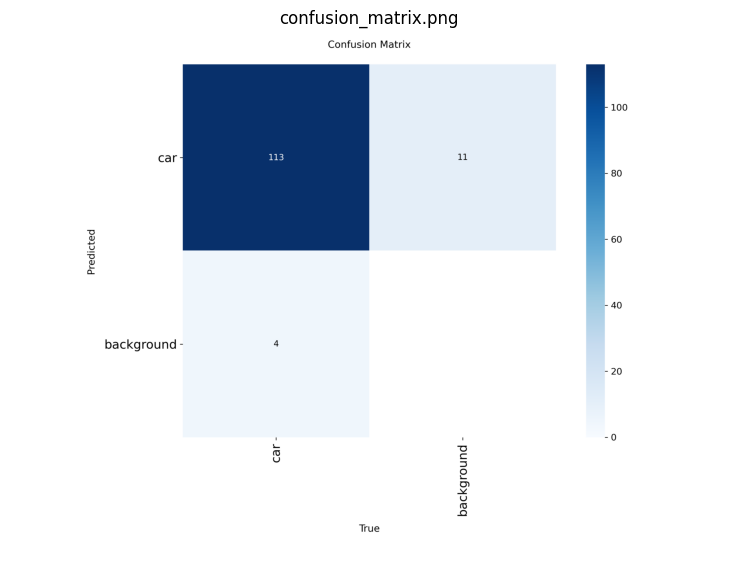

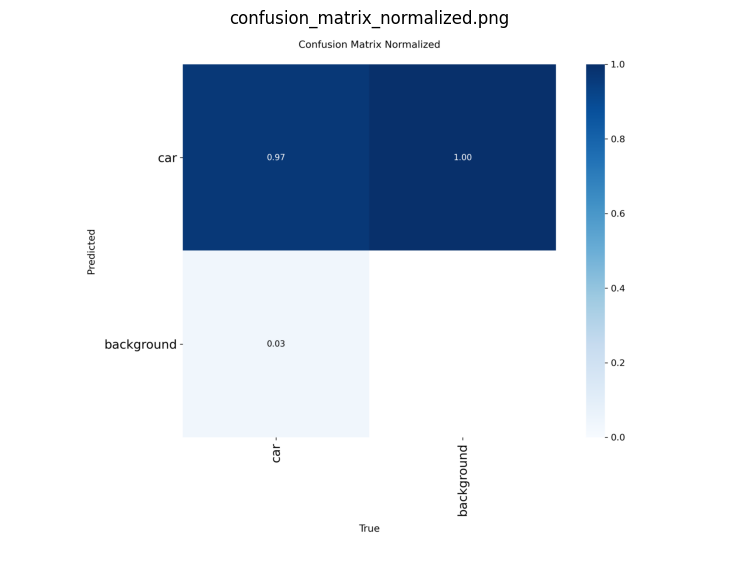

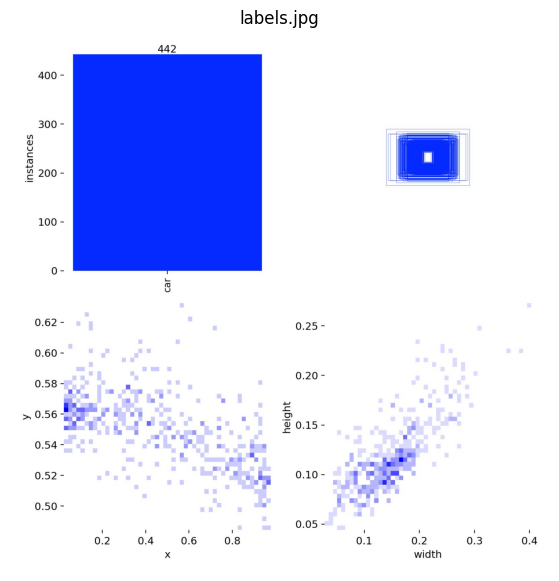

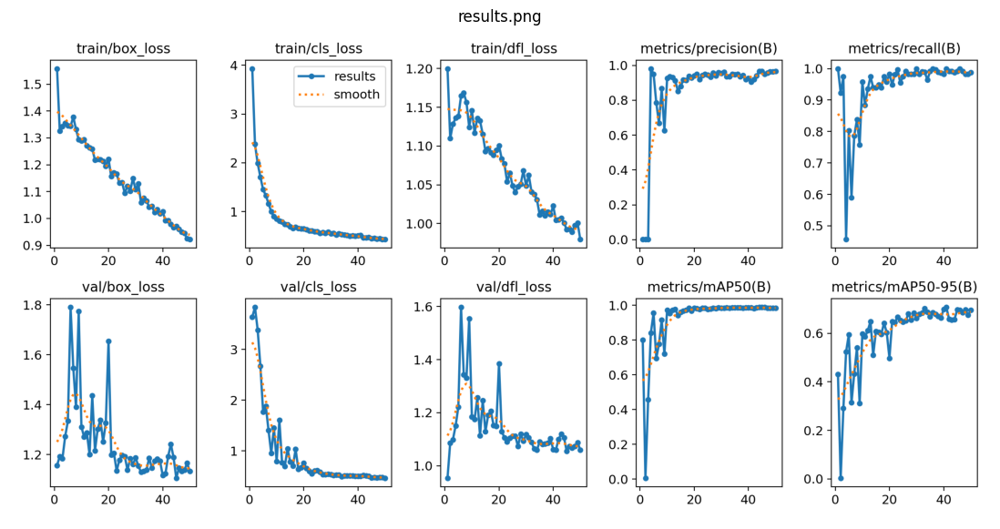

In [22]:
output_dir = Path("/content/runs/detect/train")

plot_files = [
    "BOXP_curve.png", "BoxPR_curve.png", "BoxF1_curve.png", "BoxR_curve.png",
    "confusion_matrix.png", "confusion_matrix_normalized.png",
    "labels.jpg", "labels_correlogram.jpg", "results.png"
]

# Filter only files that actually exist
existing_plots = [output_dir / f for f in plot_files if (output_dir / f).exists()]

# Display each plot
for plot_path in existing_plots:
    plot = cv2.imread(str(plot_path))
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 7))
    plt.imshow(plot)
    plt.title(plot_path.name)
    plt.axis('off')
    plt.show()


## 17. Load training metrics

In [24]:
model_result = pd.read_csv("/content/runs/detect/train/results.csv")
model_result.columns = model_result.columns.str.strip()  # clean column names
model_result.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,16.3442,1.55793,3.93035,1.19986,0.00194,1.00000,0.80046,0.43075,1.15643,3.63945,0.95381,0.000300,0.000300,0.000300
1,2,29.5487,1.32647,2.38238,1.10970,0.00179,0.92308,0.00589,0.00353,1.19285,3.83013,1.08655,0.000608,0.000608,0.000608
2,3,45.3138,1.34184,1.98694,1.12843,0.00189,0.97436,0.45680,0.29094,1.18451,3.38280,1.09879,0.000903,0.000903,0.000903
3,4,62.4417,1.35519,1.70989,1.13610,0.98163,0.45667,0.84181,0.52357,1.27283,2.67150,1.15086,0.001185,0.001185,0.001185
4,5,78.8249,1.34551,1.45094,1.13836,0.95121,0.80342,0.95628,0.59441,1.33411,1.77071,1.22169,0.001455,0.001455,0.001455


## 18. Plot per-epoch metric curves

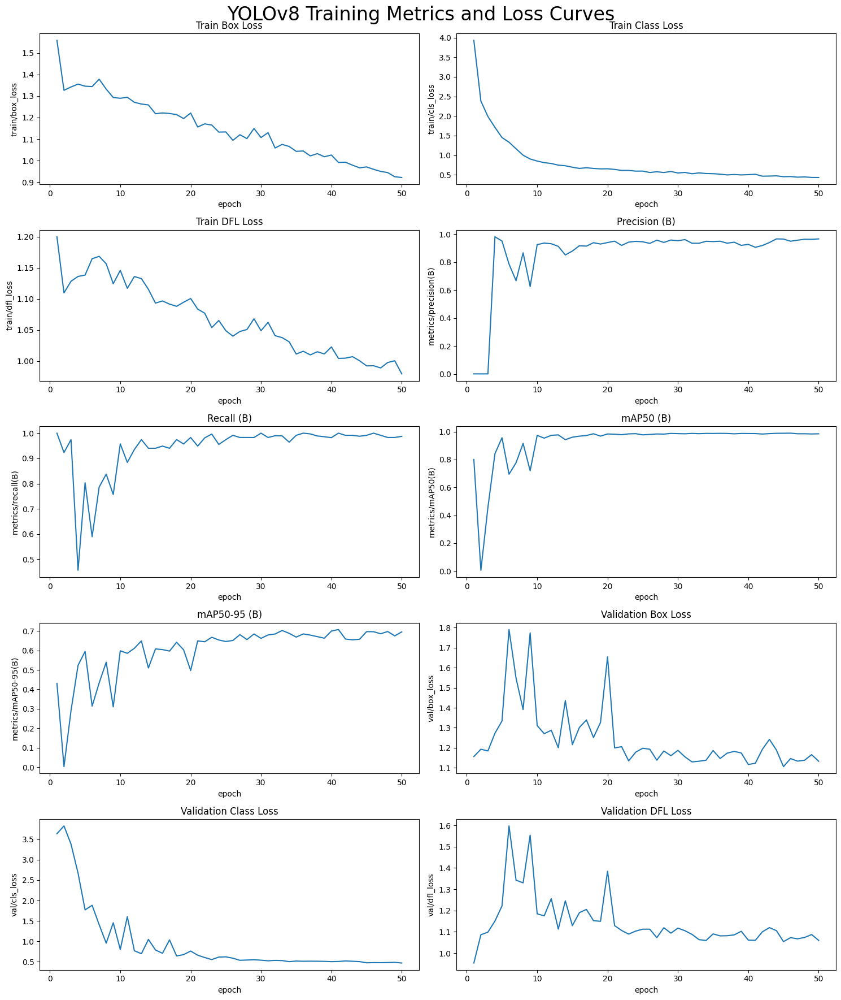

In [25]:
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 18))

sns.lineplot(x='epoch', y='train/box_loss', data=model_result, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=model_result, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=model_result, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=model_result, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=model_result, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=model_result, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=model_result, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=model_result, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=model_result, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=model_result, ax=axs[4,1])

axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Precision (B)')
axs[2,0].set(title='Recall (B)')
axs[2,1].set(title='mAP50 (B)')
axs[3,0].set(title='mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

plt.suptitle('YOLOv8 Training Metrics and Loss Curves', fontsize=24)
plt.tight_layout()
plt.show()


## 19. Inference on the test set


image 1/1 /content/drive/MyDrive/data/testing_images/vid_5_25100.jpg: 384x640 (no detections), 43.1ms
Speed: 1.9ms preprocess, 43.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
vid_5_25100.jpg: Detected boxes count: 0

image 1/1 /content/drive/MyDrive/data/testing_images/vid_5_26660.jpg: 384x640 1 car, 88.4ms
Speed: 3.6ms preprocess, 88.4ms inference, 3.0ms postprocess per image at shape (1, 3, 384, 640)
vid_5_26660.jpg: Detected boxes count: 1

image 1/1 /content/drive/MyDrive/data/testing_images/vid_5_27240.jpg: 384x640 1 car, 12.3ms
Speed: 3.7ms preprocess, 12.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
vid_5_27240.jpg: Detected boxes count: 1

image 1/1 /content/drive/MyDrive/data/testing_images/vid_5_27600.jpg: 384x640 (no detections), 16.7ms
Speed: 3.9ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
vid_5_27600.jpg: Detected boxes count: 0

image 1/1 /content/drive/MyDrive/data/testing_images/vi

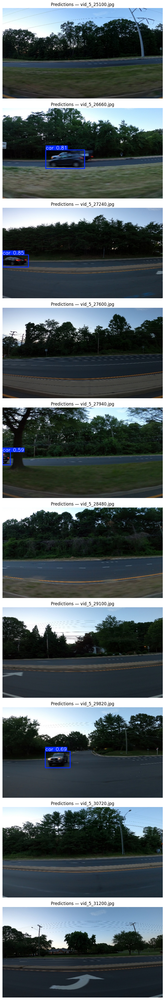

In [28]:
original_images_path = Path('data/testing_images')   # <-- change based on where your images are stored

# If your testing images are NOT in Drive and instead copied to workspace, then use:
# original_images_path = Path('/content/runs/detect/test/images')

image_files = sorted([f for f in original_images_path.iterdir() if f.suffix.lower() == '.jpg'])

step = max(1, len(image_files) // 10)
selected_images = image_files[::step][:10]

rows = len(selected_images)
fig, axes = plt.subplots(rows, 1, figsize=(12, rows * 4))

# Path to YOLO model best weights in Colab
test_model = YOLO("/content/runs/detect/train/weights/best.pt")

for i, img_path in enumerate(selected_images):
    results = test_model.predict(source=str(img_path), imgsz=640, conf=0.5)
    print(f"{img_path.name}: Detected boxes count: {len(results[0].boxes)}")

    pred_annotated = results[0].plot()
    pred_annotated = cv2.cvtColor(pred_annotated, cv2.COLOR_BGR2RGB)

    axes[i].imshow(pred_annotated)
    axes[i].set_title(f"Predictions — {img_path.name}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()


## 20. Confidence-score distribution


image 1/175 /content/drive/MyDrive/data/testing_images/vid_5_25100.jpg: 384x640 (no detections), 8.3ms
image 2/175 /content/drive/MyDrive/data/testing_images/vid_5_25120.jpg: 384x640 (no detections), 6.0ms
image 3/175 /content/drive/MyDrive/data/testing_images/vid_5_25140.jpg: 384x640 (no detections), 5.7ms
image 4/175 /content/drive/MyDrive/data/testing_images/vid_5_25160.jpg: 384x640 (no detections), 5.9ms
image 5/175 /content/drive/MyDrive/data/testing_images/vid_5_25180.jpg: 384x640 (no detections), 5.7ms
image 6/175 /content/drive/MyDrive/data/testing_images/vid_5_25200.jpg: 384x640 (no detections), 5.7ms
image 7/175 /content/drive/MyDrive/data/testing_images/vid_5_25220.jpg: 384x640 (no detections), 5.6ms
image 8/175 /content/drive/MyDrive/data/testing_images/vid_5_25240.jpg: 384x640 (no detections), 5.6ms
image 9/175 /content/drive/MyDrive/data/testing_images/vid_5_25260.jpg: 384x640 (no detections), 5.7ms
image 10/175 /content/drive/MyDrive/data/testing_images/vid_5_26320.jpg:

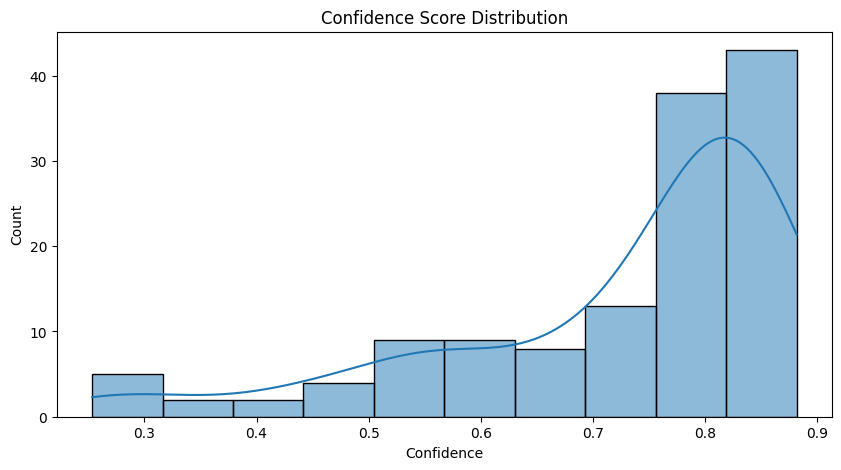

In [30]:
preds = test_model.predict(source=original_images_path, save=False)

conf_list = []
for r in preds:
    conf_list.extend(r.boxes.conf.cpu().numpy())

plt.figure(figsize=(10, 5))
sns.histplot(conf_list, kde=True)
plt.title("Confidence Score Distribution")
plt.xlabel("Confidence")
plt.ylabel("Count")
plt.show()


## 21. Visualise predictions on a random test image


image 1/1 /content/drive/MyDrive/data/testing_images/vid_5_27260.jpg: 384x640 (no detections), 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


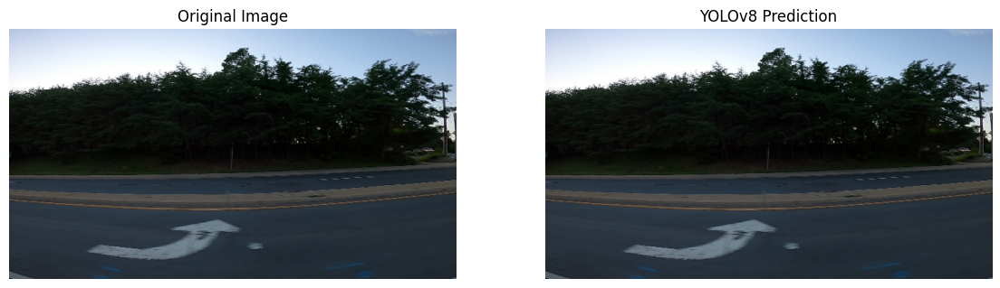

In [32]:
sample_img = random.choice(image_files)

orig = cv2.imread(str(sample_img))
orig_rgb = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)

pred = test_model.predict(source=str(sample_img), conf=0.5)[0]
pred_img = pred.plot()
pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
plt.imshow(orig_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(pred_img)
plt.title("YOLOv8 Prediction")
plt.axis("off")

plt.show()
